# AUTHOR: TOMASZ KAWIAK
# AGH Modelling of Physical Systems Lab 6 (2025 April 8th)
Sylwester Arabas (sylwester.arabas@agh.edu.pl) & Emma Ware (ecware@ucdavis.edu) 

**1. particle-resolved random-sampled state representation for an advection problem**

In [1]:
!pip install nbqa pylint

In [2]:
""" notebook code targetting 100% `nbqa pylint` score! :) """

import copy
from types import SimpleNamespace
import numpy as np
from matplotlib import pyplot
import scipy
from open_atmos_jupyter_utils import show_plot
from scipy import stats

In [3]:
PARAMS_P = SimpleNamespace(
    n_part=1000,
    norm=1e10,
    dist=scipy.stats.norm(loc=250, scale=50),
)

PARAMS_X = SimpleNamespace(
    span=1000,
    n_cell=50,
)
PARAMS_X.step = PARAMS_X.span / PARAMS_X.n_cell

RNG = np.random.default_rng(seed=44)


In [4]:
def sample(*, params_p, params_x, rng):
    """samples a particle population specified onto a grid and returns
    a collection indexed by sampling type, with values composed of `cell` and `mult`
    integer-valued arrays with cell IDs and multiplicities, respectively"""
    u01 = rng.uniform(0, 1, size=params_p.n_part)
    return {
        k: {
            "cell": (v["x"] / params_x.step).astype(int),
            "mult": np.round(v["y"] * params_p.norm).astype(int),
        }
        for k, v in {
            "sampling: uniform random in x": {
                "x": u01 * params_x.span,
                "y": params_p.dist.pdf(u01 * params_x.span)
                * params_x.span
                / params_p.n_part,
            },
            "sampling: constant multiplicity": {
                "x": params_p.dist.ppf(u01),
                "y": np.full(shape=params_p.n_part, fill_value=1 / params_p.n_part),
            },
        }.items()
    }


PARTICLES = sample(params_p=PARAMS_P, params_x=PARAMS_X, rng=RNG)


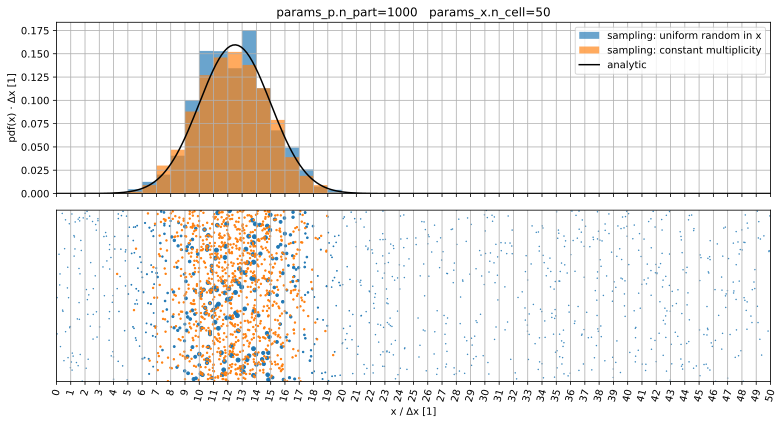

In [5]:
def plot(*, particles, params_p, params_x, rng, shift=0):
    """plots the particle state as both a histogram as well as population scatter plot
    (with random coordinates shuffled for the purpose of plotting)"""
    _, axs = pyplot.subplot_mosaic(
        [["hist"], ["part"]],
        figsize=(11, 6),
        sharex=True,
        tight_layout=True,
    )
    u01 = rng.uniform(0, 1, params_p.n_part)
    scale = params_p.norm / params_p.n_part
    for k in particles:
        axs["hist"].hist(
            x=particles[k]["cell"],
            weights=particles[k]["mult"] / params_p.norm,
            bins=params_x.n_cell,
            range=(0, params_x.n_cell),
            label=f"{k}",
            alpha=0.666,
        )
        axs["part"].scatter(
            particles[k]["cell"] + u01,
            tuple(reversed(u01)),
            s=0.25 + 2 * particles[k]["mult"] / scale,
        )
    pdf_x = np.linspace(0, params_x.span, 256)
    pdf_y = params_p.dist.pdf(pdf_x - shift)
    axs["hist"].plot(
        pdf_x / params_x.step, pdf_y * params_x.step, color="black", label="analytic"
    )
    axs["hist"].set_xlim(0, params_x.n_cell)
    axs["hist"].legend()
    axs["hist"].set_ylabel("pdf(x) ⋅ Δx [1]")
    axs["hist"].set_title(f"{params_p.n_part=}   {params_x.n_cell=}")
    axs["part"].set_xticks(np.arange(params_x.n_cell + 1))
    axs["part"].xaxis.set_tick_params(rotation=75)
    axs["part"].set_xlabel("x / Δx [1]")
    axs["part"].set_yticks([])
    axs["part"].set_ylim(0, 1)
    for axes in axs.values():
        axes.grid()
    show_plot()


plot(particles=PARTICLES, params_p=PARAMS_P, params_x=PARAMS_X, rng=RNG)


**2. Monte-Carlo representation of advection dynamics**

In [6]:
PARAMS_T = SimpleNamespace(
    span = 300,
    n_step = 30,
    wind = 1.5
)
PARAMS_T.step = PARAMS_T.span / PARAMS_T.n_step
PARAMS_T.courant_number = PARAMS_T.wind / PARAMS_X.step * PARAMS_T.step

In [7]:
def advect(*, params_p, params_t, particles, rng):
    """ performs Monte-Carlo advection of the particles """
    probability_of_shift = abs(params_t.courant_number)
    assert probability_of_shift < 1

    sign = int(abs(params_t.courant_number) / params_t.courant_number)
    for _ in range(params_t.n_step):
        u01 = rng.uniform(0, 1, params_p.n_part)
        for part in particles.values():
            part['cell'] += (probability_of_shift > u01) * sign
advect(particles=PARTICLES, params_t=PARAMS_T, params_p=PARAMS_P, rng=RNG)

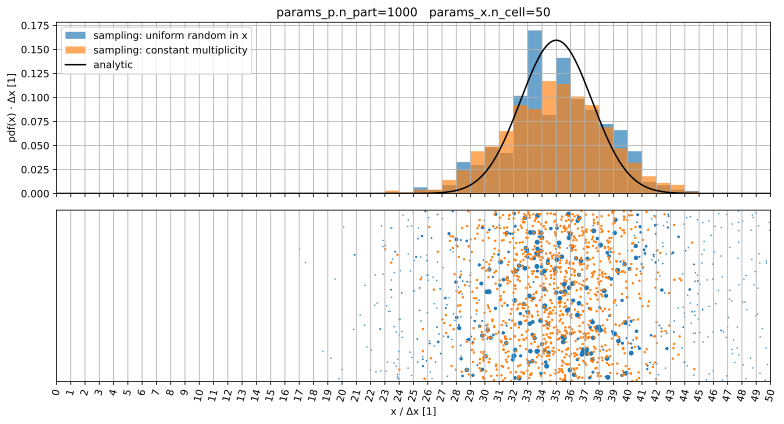

In [8]:
plot(
    particles=PARTICLES,
    params_x=PARAMS_X,
    params_p=PARAMS_P,
    rng=RNG,
    shift=PARAMS_T.wind * PARAMS_T.span,
)

---

# 3.Extending Monte-Carlo Advection to Two Dimensions

In [9]:
PARAMS_P = SimpleNamespace(
    n_part=10000,
    norm=1e10,
    loc=[250, 250],
    scale=[50, 50],
    dist=stats.multivariate_normal(mean=[250, 250], cov=[[50**2, 0], [0, 50**2]]),
)

PARAMS_X = SimpleNamespace(
    span_x=1000,
    span_y=1000,
    n_cell_x=32,
    n_cell_y=32,
)
PARAMS_X.step_x = PARAMS_X.span_x / PARAMS_X.n_cell_x
PARAMS_X.step_y = PARAMS_X.span_y / PARAMS_X.n_cell_y

RNG = np.random.default_rng(seed=44)


In [10]:
def sample_2d(*, params_p, params_x, rng):
    """
    samples a 2D particle population specified onto a grid and returns
    """
    coords = params_p.dist.rvs(size=params_p.n_part, random_state=rng)
    x_coords = coords[:, 0]
    y_coords = coords[:, 1]

    valid_indices = (
        (x_coords >= 0)
        & (x_coords < params_x.span_x)
        & (y_coords >= 0)
        & (y_coords < params_x.span_y)
    )

    avg_density = params_p.n_part / (params_x.span_x * params_x.span_y)
    pdf_vals = params_p.dist.pdf(coords[valid_indices])
    mult_vals = pdf_vals / avg_density

    total_mass = params_p.norm
    mult_normalized = mult_vals * (total_mass / np.sum(mult_vals))

    return {
        # Simplified to one sampling method for clarity
        "sampling: constant multiplicity 2D": {
            "cell_x": (x_coords / params_x.step_x).astype(int),
            "cell_y": (y_coords / params_x.step_y).astype(int),
            "mult": np.round(mult_normalized).astype(int),
            "x": x_coords,
            "y": y_coords,
        }
    }


In [11]:
def plot_2d(particles, config):
    """
    Plots particle histogram and analytic contours.

    config must have:
      .params_p, .params_x, .shift_x, .shift_y, .title
    """
    fig, ax = pyplot.subplots(figsize=(8, 7), tight_layout=True)

    # grab the one sampling entry
    data = next(iter(particles.values()))

    # Monte-Carlo 2D histogram
    counts, xe, ye, im = ax.hist2d(
        x=data["cell_x"],
        y=data["cell_y"],
        weights=data["mult"] / config.params_p.norm,
        bins=(config.params_x.n_cell_x, config.params_x.n_cell_y),
        range=[[0, config.params_x.n_cell_x], [0, config.params_x.n_cell_y]],
        cmap="viridis",
    )
    fig.colorbar(im, ax=ax, label="Normalized Particle Density")

    # analytic solution
    centers, x_m, y_m, fine = _calculate_analytic_solution(config, xe, ye)
    ax.contour(
        x_m / config.params_x.step_x,
        y_m / config.params_x.step_y,
        fine,
        linestyles="dashed",
        levels=5,
        colors="red",
    )
    ax.plot([], [], linestyle="dashed", color="red", label="Analytic Solution")

    # axes formatting
    ax.set_xlim(0, config.params_x.n_cell_x)
    ax.set_ylim(0, config.params_x.n_cell_y)
    ax.set_xlabel("x / Δx [1]")
    ax.set_ylabel("y / Δy [1]")

    title = config.title or (
        f"n_part={config.params_p.n_part}, "
        f"nx={config.params_x.n_cell_x}, "
        f"ny={config.params_x.n_cell_y}"
    )
    ax.set_title(title)

    ax.legend()
    ax.grid(True, linestyle=":", alpha=0.6)
    ax.set_aspect("equal", adjustable="box")

    show_plot(fig=fig)
    return counts, centers.T


In [12]:
PARTICLES = sample_2d(params_p=PARAMS_P, params_x=PARAMS_X, rng=RNG)

In [13]:
def _calculate_analytic_solution(config, xedges, yedges):
    """Calculate analytic solution grid for the 2D plot."""

    x_c, y_c = np.meshgrid(
        (xedges[:-1] + xedges[1:]) / 2 * config.params_x.step_x,
        (yedges[:-1] + yedges[1:]) / 2 * config.params_x.step_y,
    )

    # build shifted multivariate normal
    mean = [
        config.params_p.loc[0] + config.shift_x,
        config.params_p.loc[1] + config.shift_y,
    ]
    cov = [
        [config.params_p.scale[0] ** 2, 0],
        [0, config.params_p.scale[1] ** 2],
    ]
    dist = stats.multivariate_normal(mean=mean, cov=cov)

    # PDF at bin centers
    analytic_centers = (
        dist.pdf(np.dstack((x_c, y_c)))
        * config.params_x.step_x
        * config.params_x.step_y
    )

    x_m, y_m = np.meshgrid(
        np.linspace(0, config.params_x.span_x, 100),
        np.linspace(0, config.params_x.span_y, 100),
    )
    pos_fine = np.dstack((x_m, y_m))
    pdf_fine = dist.pdf(pos_fine)
    scaled_fine = pdf_fine * config.params_x.step_x * config.params_x.step_y

    return analytic_centers, x_m, y_m, scaled_fine


In [14]:
PARAMS_T = SimpleNamespace(span=500, n_step=50, wind_x=1.25, wind_y=0.75)
PARAMS_T.step = PARAMS_T.span / PARAMS_T.n_step

PARAMS_T.courant_number_x = PARAMS_T.wind_x / \
            PARAMS_X.step_x * PARAMS_T.step
PARAMS_T.courant_number_y = PARAMS_T.wind_y / \
    PARAMS_X.step_y * PARAMS_T.step

assert abs(PARAMS_T.courant_number_x) < 1, \
    "Courant number in x must be < 1"
assert abs(PARAMS_T.courant_number_y) < 1, \
    "Courant number in y must be < 1"

print(f"Courant Number X: {PARAMS_T.courant_number_x:.3f}")
print(f"Courant Number Y: {PARAMS_T.courant_number_y:.3f}")


Courant Number X: 0.400
Courant Number Y: 0.240


In [15]:
def distinct_plot(*, particles, rng, config_distinct):
    """
    Plots the particle distributions projected on x and y axes.

    Shows both histogram and particle scatter representations along with analytic solution.
    """
    _, axs = pyplot.subplot_mosaic(
        [["hist_x", "hist_y"], ["part_x", "part_y"]],
        figsize=(14, 10),
        tight_layout=True,
    )

    part_key = next(iter(particles))
    part_data = particles[part_key]

    u01_x = rng.uniform(0, 1, len(part_data["cell_x"]))
    u01_y = rng.uniform(0, 1, len(part_data["cell_y"]))
    scale = config_distinct.params_p.norm / config_distinct.params_p.n_part

    # X-axis projection
    axs["hist_x"].hist(
        x=part_data["cell_x"],
        weights=part_data["mult"] / config_distinct.params_p.norm,
        bins=config_distinct.params_x.n_cell_x,
        range=(0, config_distinct.params_x.n_cell_x),
        label="MC X-projection",
        alpha=0.666,
        color="blue",
    )
    axs["part_x"].scatter(
        part_data["cell_x"] + u01_x,
        tuple(reversed(u01_x)),
        s=0.25 + 2 * part_data["mult"] / scale,
        color="blue",
        alpha=0.5,
    )

    # Y-axis projection
    axs["hist_y"].hist(
        x=part_data["cell_y"],
        weights=part_data["mult"] / config_distinct.params_p.norm,
        bins=config_distinct.params_x.n_cell_y,
        range=(0, config_distinct.params_x.n_cell_y),
        label="MC Y-projection",
        alpha=0.666,
        color="green",
    )
    axs["part_y"].scatter(
        part_data["cell_y"] + u01_y,
        tuple(reversed(u01_y)),
        s=0.25 + 2 * part_data["mult"] / scale,
        color="green",
        alpha=0.5,
    )

    # Analytic solutions
    pdf_x_grid = np.linspace(0, config_distinct.params_x.span_x, 256)
    pdf_x = stats.norm(
        loc=config_distinct.params_p.loc[0] + getattr(config_distinct, "shift_x", 0),
        scale=config_distinct.params_p.scale[0],
    ).pdf(pdf_x_grid)
    axs["hist_x"].plot(
        pdf_x_grid / config_distinct.params_x.step_x,
        pdf_x * config_distinct.params_x.step_x,
        color="black",
        label="analytic",
    )

    pdf_y_grid = np.linspace(0, config_distinct.params_x.span_y, 256)
    pdf_y = stats.norm(
        loc=config_distinct.params_p.loc[1] + getattr(config_distinct, "shift_y", 0),
        scale=config_distinct.params_p.scale[1],
    ).pdf(pdf_y_grid)
    axs["hist_y"].plot(
        pdf_y_grid / config_distinct.params_x.step_y,
        pdf_y * config_distinct.params_x.step_y,
        color="black",
        label="analytic",
    )

    # Format X projection plots
    axs["hist_x"].set_xlim(0, config_distinct.params_x.n_cell_x)
    axs["hist_x"].legend()
    axs["hist_x"].set_ylabel("pdf(x) ⋅ Δx [1]")
    axs["hist_x"].set_title(
        f"X-Axis Projection {getattr(config_distinct, 'title', '')}"
    )
    axs["part_x"].set_xticks(np.arange(0, config_distinct.params_x.n_cell_x + 1, 4))
    axs["part_x"].xaxis.set_tick_params(rotation=75)
    axs["part_x"].set_xlabel("x / Δx [1]")
    axs["part_x"].set_yticks([])
    axs["part_x"].set_ylim(0, 1)

    # Format Y projection plots
    axs["hist_y"].set_xlim(0, config_distinct.params_x.n_cell_y)
    axs["hist_y"].legend()
    axs["hist_y"].set_ylabel("pdf(y) ⋅ Δy [1]")
    axs["hist_y"].set_title(
        f"Y-Axis Projection {getattr(config_distinct, 'title', '')}"
    )
    axs["part_y"].set_xticks(np.arange(0, config_distinct.params_x.n_cell_y + 1, 4))
    axs["part_y"].xaxis.set_tick_params(rotation=75)
    axs["part_y"].set_xlabel("y / Δy [1]")
    axs["part_y"].set_yticks([])
    axs["part_y"].set_ylim(0, 1)

    # Add grid to all subplots
    for axes in axs.values():
        axes.grid(True, linestyle=":", alpha=0.6)

    # If show_plot is not defined, fallback to pyplot.show()
    try:
        show_plot(fig=pyplot.gcf())
    except NameError:
        pyplot.show()


In [16]:
def advect_2d(*, params_t, params_x, particles, rng):
    """performs 2D Monte-Carlo advection of the particles"""
    prob_shift_x = abs(params_t.courant_number_x)
    prob_shift_y = abs(params_t.courant_number_y)

    sign_x = np.sign(params_t.courant_number_x).astype(int)
    sign_y = np.sign(params_t.courant_number_y).astype(int)

    part_key = list(particles.keys())[0]
    part_data = particles[part_key]

    n_particles_current = len(part_data["cell_x"])

    for _ in range(params_t.n_step):
        # Generate random numbers for x and y shifts independently
        u01_x = rng.uniform(0, 1, n_particles_current)
        u01_y = rng.uniform(0, 1, n_particles_current)

        # Update cell indices based on probabilities
        part_data["cell_x"] += (prob_shift_x > u01_x) * sign_x
        part_data["cell_y"] += (prob_shift_y > u01_y) * sign_y

        # Simple boundary handling
        valid_indices = (
            (part_data["cell_x"] >= 0)
            & (part_data["cell_x"] < params_x.n_cell_x)
            & (part_data["cell_y"] >= 0)
            & (part_data["cell_y"] < params_x.n_cell_y)
        )

        if not np.all(valid_indices):
            for key in ["cell_x", "cell_y", "mult", "x", "y"]:
                if key in part_data:
                    part_data[key] = part_data[key][valid_indices]
            n_particles_current = len(part_data["cell_x"])


In [17]:
PARTICLES_ADVECTED = copy.deepcopy(PARTICLES)
advect_2d(
    particles=PARTICLES_ADVECTED,
    params_t=PARAMS_T,
    params_x=PARAMS_X,
    rng=RNG,
)

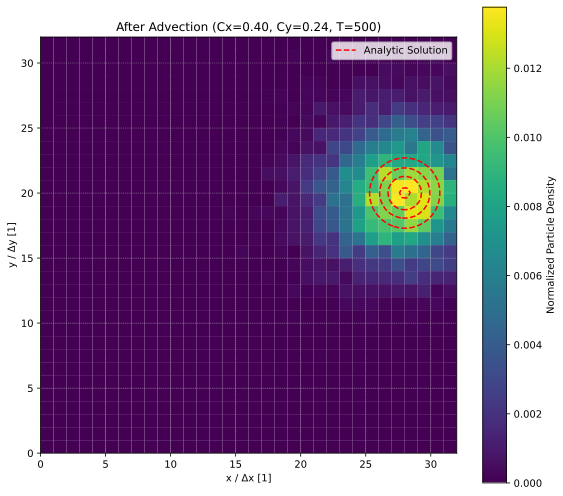

In [18]:
total_shift_x = PARAMS_T.wind_x * PARAMS_T.span
total_shift_y = PARAMS_T.wind_y * PARAMS_T.span

config_super = SimpleNamespace(
    params_p=PARAMS_P,
    params_x=PARAMS_X,
    shift_x=total_shift_x,
    shift_y=total_shift_y,
    title=f"After Advection (Cx={PARAMS_T.courant_number_x:.2f}, \
Cy={PARAMS_T.courant_number_y:.2f}, T={PARAMS_T.span})",
)

mc_final_grid, analytic_final_grid = plot_2d(PARTICLES_ADVECTED, config_super)


In [19]:
distinct_cfg = SimpleNamespace(
    params_p=PARAMS_P,
    params_x=PARAMS_X,
    shift_x=total_shift_x,
    shift_y=total_shift_y,
    title=f"After Advection (Cx={PARAMS_T.courant_number_x:.2f}, \
Cy={PARAMS_T.courant_number_y:.2f}, T={PARAMS_T.span})",
)
distinct_plot(
    particles=PARTICLES_ADVECTED,
    rng=RNG,
    config_distinct=distinct_cfg,
)


In [20]:
assert (
    mc_final_grid.shape == analytic_final_grid.shape
), f"Grid shapes mismatch: MC {mc_final_grid.shape}, \
      Analytic {analytic_final_grid.shape}"

mae = np.mean(np.abs(mc_final_grid - analytic_final_grid))

rmse = np.sqrt(np.mean((mc_final_grid - analytic_final_grid) ** 2))

print(f"Mean Absolute Error (MAE): {mae:.4e}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4e}")


Mean Absolute Error (MAE): 8.7877e-04
Root Mean Squared Error (RMSE): 3.8889e-03


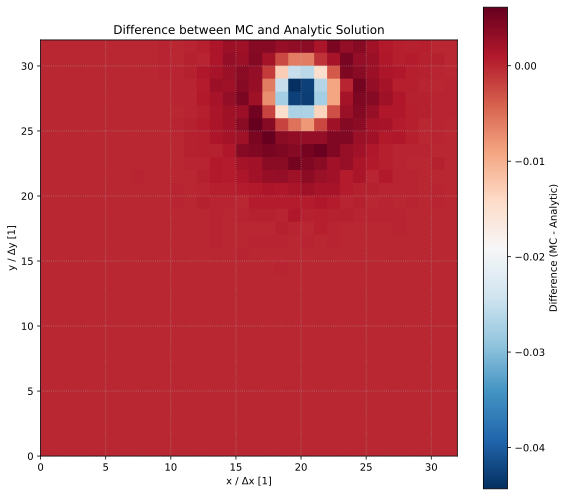

In [21]:
diff_fig, diff_ax = pyplot.subplots(figsize=(8, 7), tight_layout=True)
im_diff = diff_ax.imshow(
    mc_final_grid - analytic_final_grid,
    origin="lower",
    extent=[0, PARAMS_X.n_cell_x, 0, PARAMS_X.n_cell_y],
    aspect="equal",
    cmap="RdBu_r",
)


diff_fig.colorbar(im_diff, ax=diff_ax, label="Difference (MC - Analytic)")
diff_ax.set_xlabel("x / Δx [1]")
diff_ax.set_ylabel("y / Δy [1]")
diff_ax.set_title("Difference between MC and Analytic Solution")
diff_ax.grid(True, linestyle=":", alpha=0.6)
show_plot(fig=diff_fig)


---


In [22]:
!nbqa pylint stochasticadv.ipynb


------------------------------------
Your code has been rated at 10.00/10

